# Data-sources exploration using `eo-learn`

This notebook is adapted based on the `data_sources_explorer.ipynb` from the [eo-learn-workshop](https://github.com/sentinel-hub/eo-learn-workshop).

The steps are as follow:
 * load an area bounding box
 * add Sentinel-2 imaging data
 * add Sentinel-1 imaging data

Add generic packages

In [1]:
%matplotlib inline

import os
from pathlib import Path

from matplotlib import dates
from mpl_toolkits.axes_grid1 import make_axes_locatable
from shapely.geometry import Polygon, box
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np

Set path to data

In [2]:
data_dir = Path('..', 'data')
os.listdir(data_dir)

['denmark.geojson',
 'denmark_bbox.geojson',
 'land_use_10class_reference_slovenia_partial.gpkg',
 'osm_rd_congo_localities.geojson',
 'statapi_kranj.geojson',
 'svn_border.geojson']

`eo-learn` and `sentinelhub` imports

In [3]:
from eolearn.core import FeatureType#EOTask, EOPatch, 
from eolearn.io import SentinelHubInputTask, SentinelHubEvalscriptTask

In [4]:
from sentinelhub import BBox, DataCollection

In [5]:
gdf = gpd.read_file(Path.joinpath(data_dir,"denmark_bbox.geojson"))

## 1. Retrieve S2 L1C data <a id="sentinel-2"></a>

In [6]:
s2_rgb_task = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL2_L1C,
    bands=['B04', 'B03', 'B02'],
    bands_feature=(FeatureType.DATA, 'S2-RGB'),
    additional_data=[(FeatureType.MASK, 'dataMask')],
    resolution=(10, 10),
    maxcc=0.1
)

In [7]:
ndvi_evalscript = """
//VERSION=3

function setup() {
  return {
    input: ["B04", "B08"],
    output:[
      {
        id: "ndvi",
        bands: 1,
        sampleType: SampleType.FLOAT32
      },
    ]
  }
}

function evaluatePixel(sample) {
  let ndvi = index(sample.B08, sample.B04);
  return {
    ndvi: [ndvi],
  };
}
"""

s2_ndvi_task = SentinelHubEvalscriptTask(
    features=[(FeatureType.DATA, 'ndvi', 'NDVI')],
    evalscript=ndvi_evalscript,
    data_collection=DataCollection.SENTINEL2_L1C,
    resolution=(10, 10),
    maxcc=0.1
)

In [8]:
time_interval = ['2019-05-01','2019-09-01']
idx = 436
bbox = BBox(gdf.loc[idx].geometry.bounds, gdf.crs)

Download TRUE-COLOR

In [9]:
eopatch = s2_rgb_task.execute(bbox=bbox, time_interval=time_interval)

eopatch

EOPatch(
  bbox=BBox(((602120.9239705771, 6220956.269831697), (612144.3798617239, 6231025.750548924)), crs=CRS('32632'))
  timestamps=[2019-05-23 10:45:14, ...]<length=19>
  mask={
    dataMask: numpy.ndarray(shape=(19, 1007, 1002, 1), dtype=bool)
  }
  data={
    S2-RGB: numpy.ndarray(shape=(19, 1007, 1002, 3), dtype=float32)
  }
)

Download NDVI

In [10]:
eopatch = s2_ndvi_task.execute(eopatch)

eopatch

EOPatch(
  bbox=BBox(((602120.9239705771, 6220956.269831697), (612144.3798617239, 6231025.750548924)), crs=CRS('32632'))
  timestamps=[2019-05-23 10:45:14, ...]<length=19>
  mask={
    dataMask: numpy.ndarray(shape=(19, 1007, 1002, 1), dtype=bool)
  }
  data={
    NDVI: numpy.ndarray(shape=(19, 1007, 1002, 1), dtype=float32)
    S2-RGB: numpy.ndarray(shape=(19, 1007, 1002, 3), dtype=float32)
  }
)

In [11]:
eopatch.timestamp

C:\Users\Yves Zigashane\AppData\Local\Temp\ipykernel_17140\881395196.py:1: EODeprecationWarning: The attribute `timestamp` is deprecated, use `timestamps` instead.
  eopatch.timestamp


[datetime.datetime(2019, 5, 23, 10, 45, 14),
 datetime.datetime(2019, 5, 25, 10, 35, 26),
 datetime.datetime(2019, 5, 28, 10, 45, 19),
 datetime.datetime(2019, 6, 4, 10, 35, 26),
 datetime.datetime(2019, 6, 7, 10, 45, 18),
 datetime.datetime(2019, 6, 7, 10, 45, 23),
 datetime.datetime(2019, 6, 14, 10, 35, 25),
 datetime.datetime(2019, 6, 17, 10, 45, 18),
 datetime.datetime(2019, 6, 22, 10, 45, 14),
 datetime.datetime(2019, 6, 29, 10, 35, 18),
 datetime.datetime(2019, 6, 29, 10, 35, 22),
 datetime.datetime(2019, 7, 9, 10, 35, 19),
 datetime.datetime(2019, 7, 9, 10, 35, 23),
 datetime.datetime(2019, 7, 24, 10, 35, 22),
 datetime.datetime(2019, 7, 24, 10, 35, 26),
 datetime.datetime(2019, 8, 3, 10, 35, 22),
 datetime.datetime(2019, 8, 11, 10, 45, 14),
 datetime.datetime(2019, 8, 31, 10, 45, 11),
 datetime.datetime(2019, 8, 31, 10, 45, 16)]

Plot RGB of time frames

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00035..8.2831].


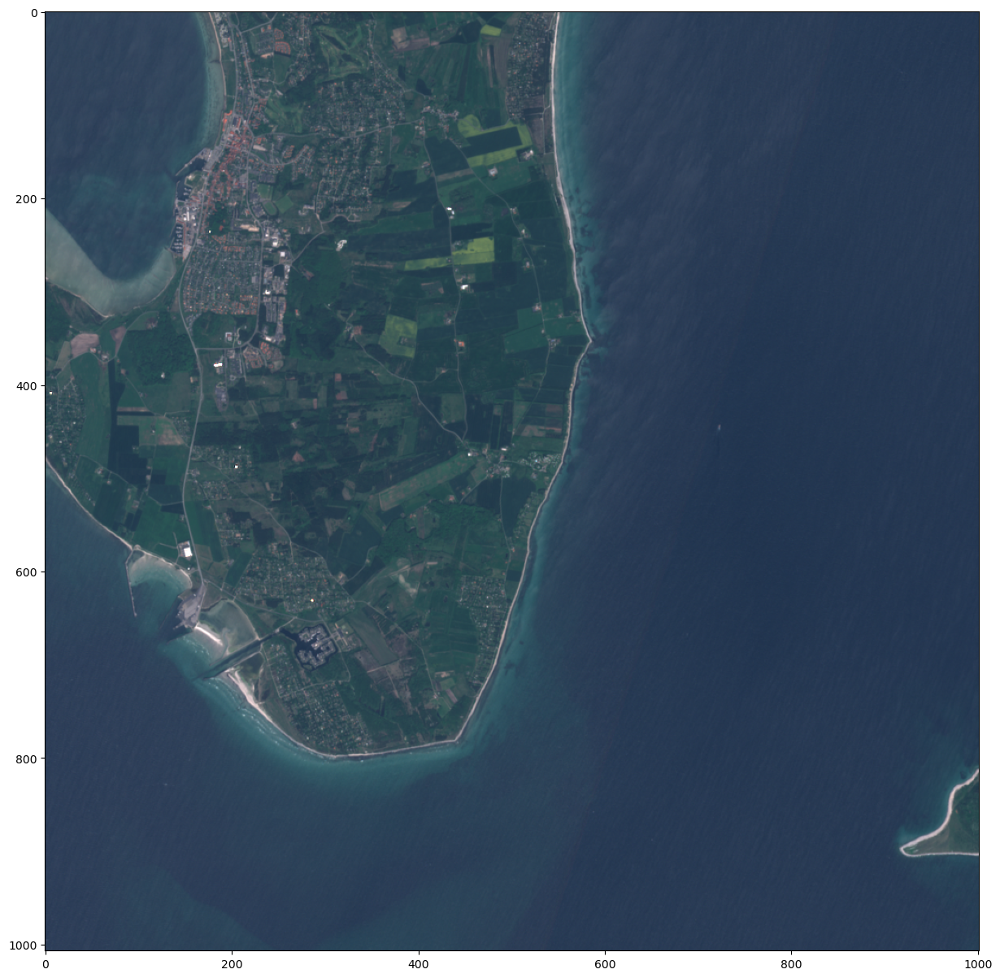

In [12]:
time_idx = 0

rgb = eopatch.data['S2-RGB']

fig, ax = plt.subplots(figsize=(15, 15))
ax.imshow(rgb[time_idx] * 3.5);

Plot the median RGB values

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0889..2.14935].


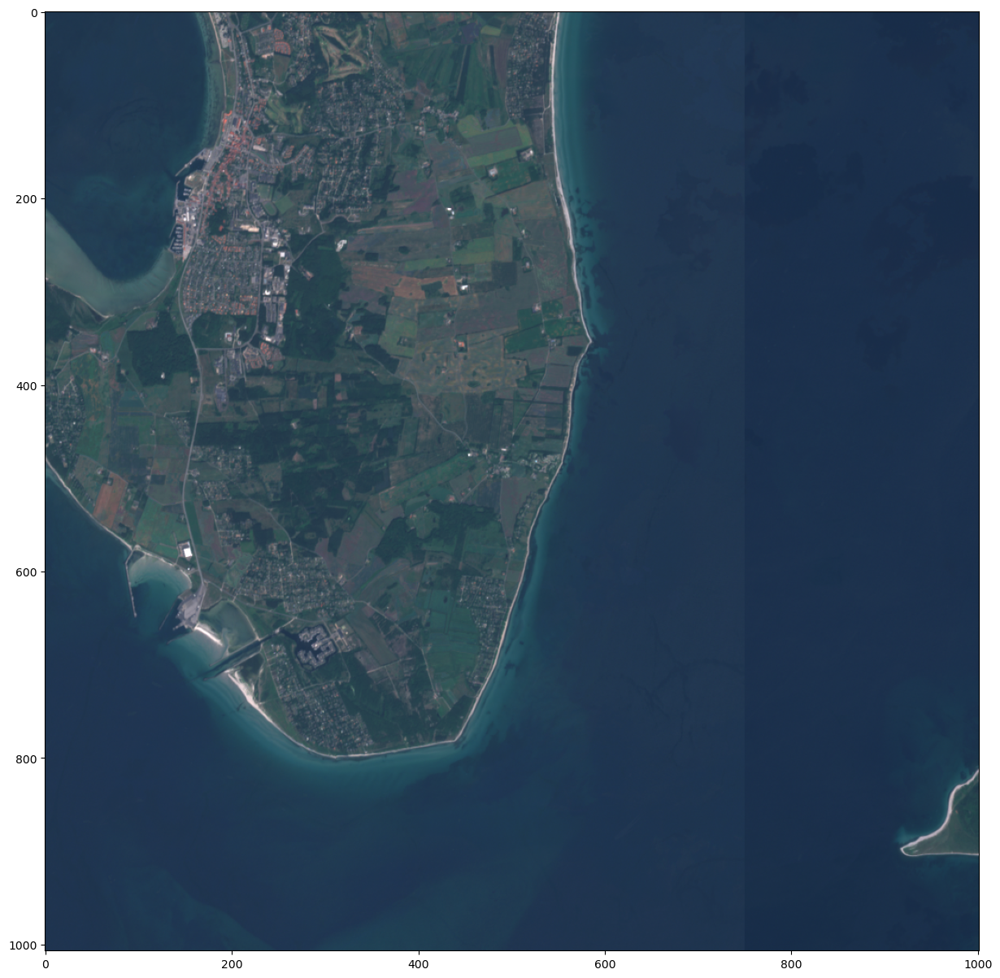

In [13]:
fig, ax = plt.subplots(figsize=(15, 15))

ax.imshow(np.median(rgb, axis=0).squeeze() * 3.5);

Plot the median NDVI values

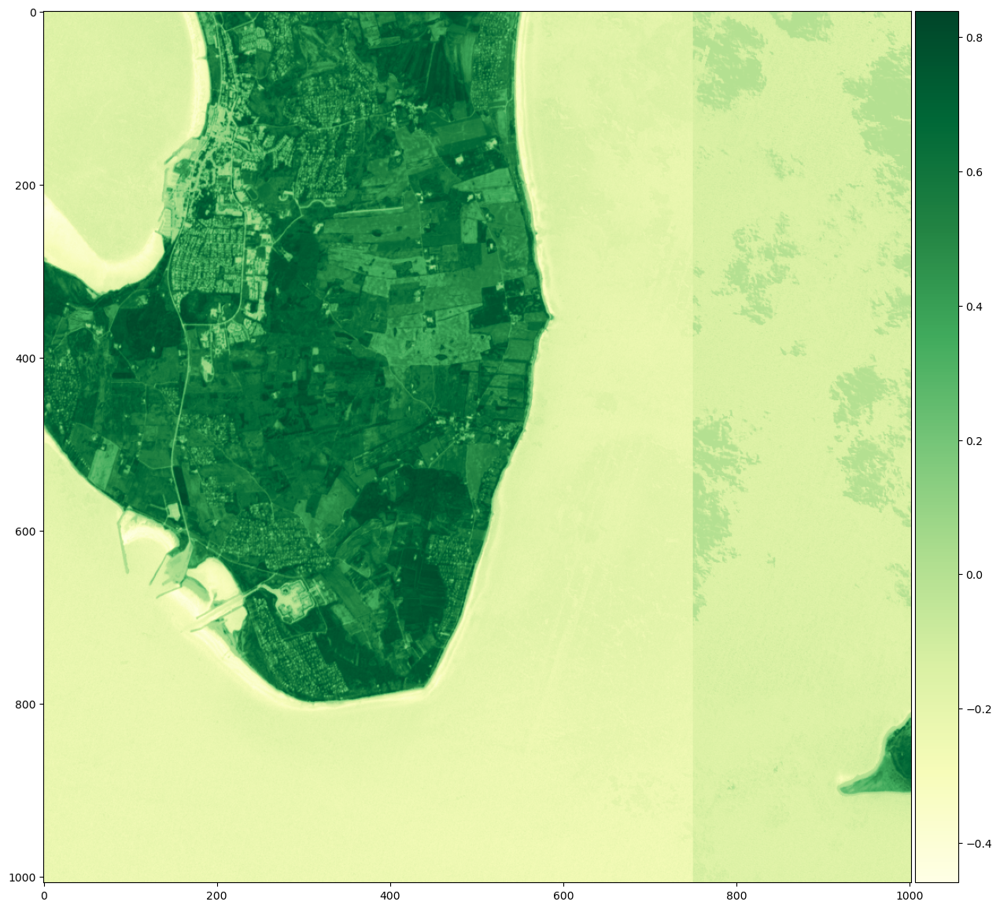

In [14]:
ndvi = eopatch.data['NDVI']
median_ndvi = np.median(ndvi, axis=0).squeeze()

fig, ax = plt.subplots(figsize=(15,15))
im = ax.imshow(median_ndvi, cmap=plt.cm.YlGn)

divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im, cax=cax, orientation='vertical');

Plot temporal NDVI of a given location

C:\Users\Yves Zigashane\AppData\Local\Temp\ipykernel_17140\2624814651.py:1: EODeprecationWarning: The attribute `timestamp` is deprecated, use `timestamps` instead.
  dates_num = dates.date2num(eopatch.timestamp)
C:\Users\Yves Zigashane\AppData\Local\Temp\ipykernel_17140\2624814651.py:2: EODeprecationWarning: The attribute `timestamp` is deprecated, use `timestamps` instead.
  dates_str = [timestamp.date().isoformat() for timestamp in eopatch.timestamp]


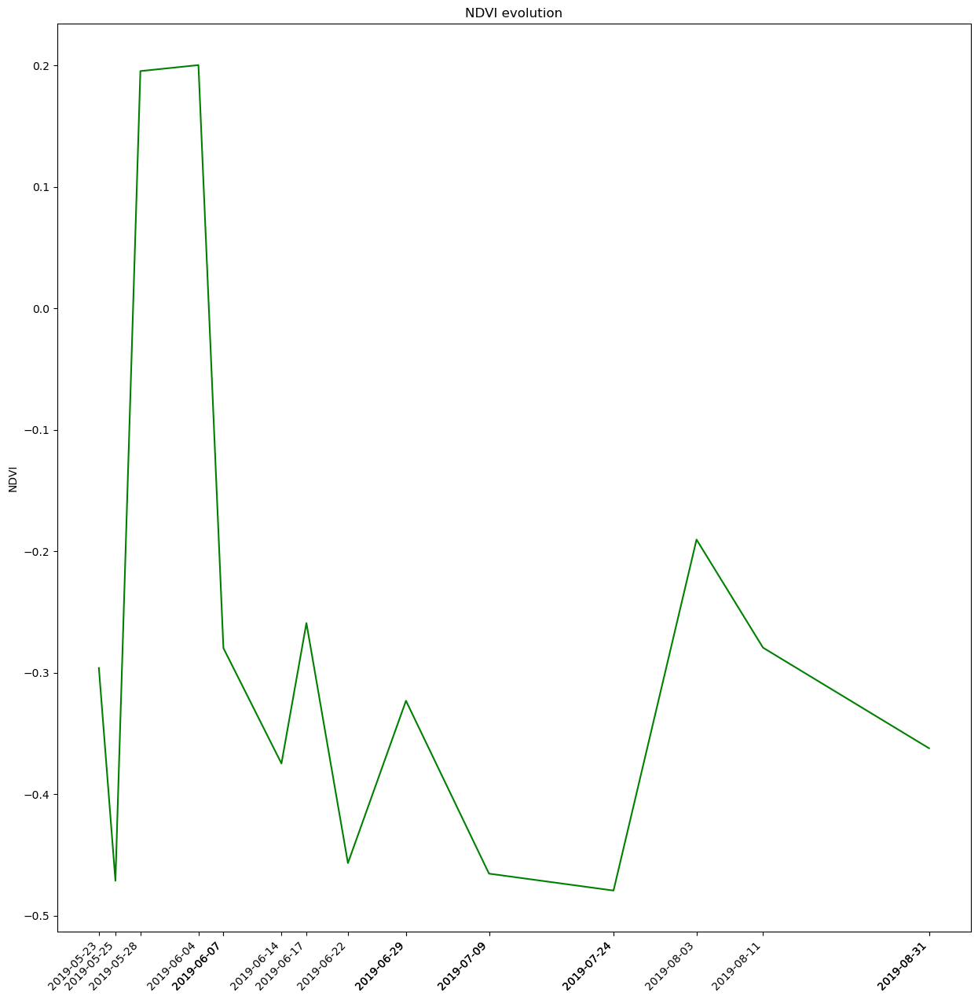

In [15]:
dates_num = dates.date2num(eopatch.timestamp)
dates_str = [timestamp.date().isoformat() for timestamp in eopatch.timestamp]

fig, ax = plt.subplots(figsize=(15, 15))
ax.plot(dates_num, ndvi[:, 100, 550, :].squeeze(), 'g')

ax.set_title('NDVI evolution')
ax.set_xticks(dates_num);
ax.set_xticklabels(dates_str, rotation=45, ha='right');
ax.set_ylabel('NDVI');

## 4. Retrieve S1 data <a id="sentinel-1"></a>

In [16]:
s1_iw_des_task = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL1_IW_DES,
    bands=['VV'],
    bands_feature=(FeatureType.DATA, 'S1-IW-DES'),
    additional_data=[(FeatureType.MASK, 'dataMask')],
    resolution=(10, 10)
)

s1_iw_asc_task = SentinelHubInputTask(
    data_collection=DataCollection.SENTINEL1_IW_ASC,
    bands=['VV'],
    bands_feature=(FeatureType.DATA, 'S1-IW-ASC'),
    additional_data=[(FeatureType.MASK, 'dataMask')],
    resolution=(10, 10)
)

In [17]:
eopatch_s1_des = s1_iw_des_task.execute(bbox=bbox, time_interval=['2019-07-01','2019-08-01'])

eopatch_s1_des

EOPatch(
  bbox=BBox(((602120.9239705771, 6220956.269831697), (612144.3798617239, 6231025.750548924)), crs=CRS('32632'))
  timestamps=[2019-07-03 05:39:59, ...]<length=17>
  mask={
    dataMask: numpy.ndarray(shape=(17, 1007, 1002, 1), dtype=bool)
  }
  data={
    S1-IW-DES: numpy.ndarray(shape=(17, 1007, 1002, 1), dtype=float32)
  }
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00017930780304595845..484.7820495605469].


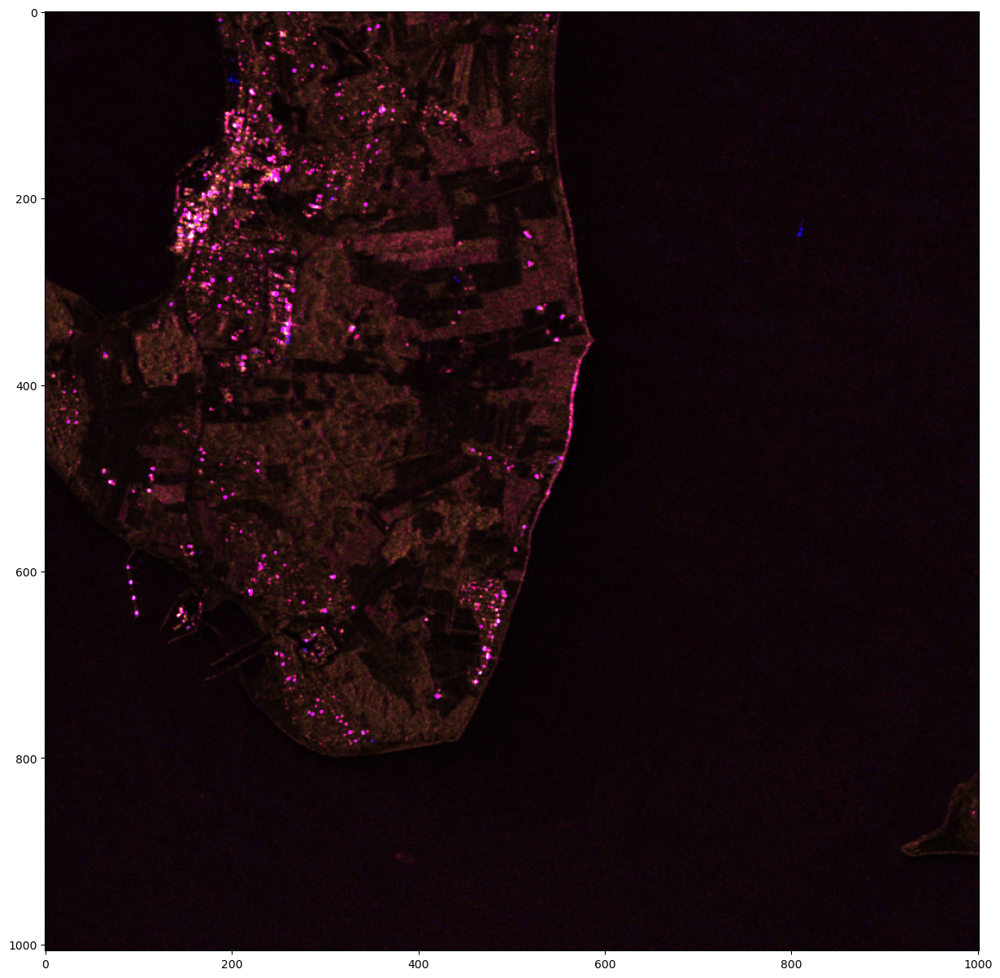

In [18]:
vv_data = eopatch_s1_des.data['S1-IW-DES']
vv_data[np.isnan(vv_data)] = 0

vv_des_r = np.percentile(vv_data, 80, axis=0)
vv_des_g = np.percentile(vv_data, 20, axis=0)
vv_des_b = np.std(vv_data, axis=0)

vv_rgb = np.concatenate((vv_des_r, vv_des_g, vv_des_b), axis=-1)

plt.figure(figsize=(15, 15))
plt.imshow(vv_rgb);

In [19]:
eopatch_s1_asc = s1_iw_asc_task.execute(bbox=bbox, time_interval=['2019-07-01','2019-08-01'])

eopatch_s1_asc

EOPatch(
  bbox=BBox(((602120.9239705771, 6220956.269831697), (612144.3798617239, 6231025.750548924)), crs=CRS('32632'))
  timestamps=[2019-07-02 17:01:36, ...]<length=11>
  mask={
    dataMask: numpy.ndarray(shape=(11, 1007, 1002, 1), dtype=bool)
  }
  data={
    S1-IW-ASC: numpy.ndarray(shape=(11, 1007, 1002, 1), dtype=float32)
  }
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..265.94977].


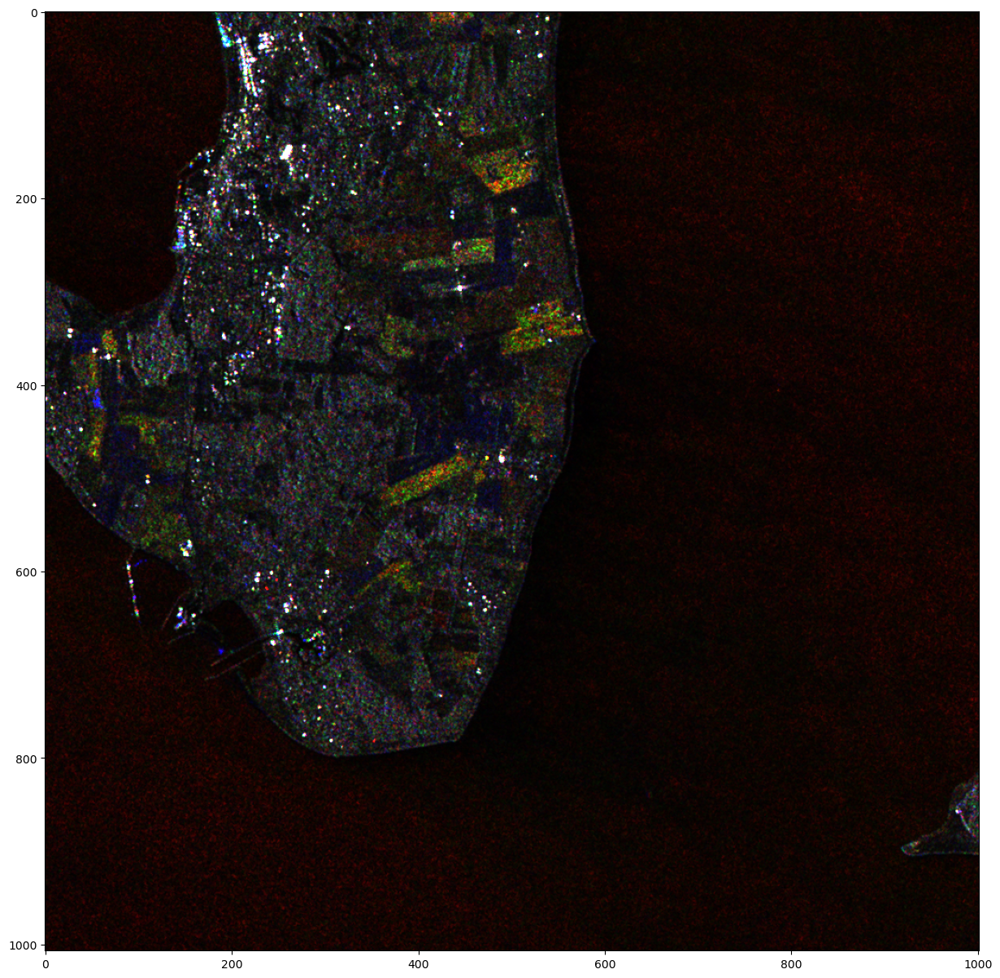

In [20]:
vv_data = eopatch_s1_asc.data['S1-IW-ASC']
vv_data[np.isnan(vv_data)] = 0

vv_des_r = vv_data[0]
vv_des_g = vv_data[2]
vv_des_b = vv_data[10]

vv_rgb = np.concatenate((vv_des_r, vv_des_g, vv_des_b), axis=-1)

plt.figure(figsize=(15, 15))
plt.imshow(vv_rgb);

Similarly, Sentinel-2 L2A data can be added, as well as Digital Elevation data